# Plotly subplots and more, Altair demo

### Handy hints 

* In general, we are using plotting libraries that return objects encapsulating the plot. You can check the type of these returned objects with `type()`. Jupyter's tools for exploring objects and methods will also be useful: the `?` and `??` operators, and tab autocompletion.

* If you are using an older version of Jupyter you are running, you may need to launch this notebook with a higher data rate limit: `jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000` (alternatively, upgrade your Jupyter version).

## Setup 

In [1]:
import pandas as pd
import numpy as np

In [2]:
# We may want to use some colours etc from other libraries
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Use the plotly.offline module to use plotly without a cloud account
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
from plotly import tools
import plotly

In [4]:
# init_notebook_mode() will inject the Plotly javascript into our notebook
# so we can display plots inline using iplot()
init_notebook_mode(connected=True)

In [73]:
# uncomment these lines to import and initialise altair
import altair as alt
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

## Data

In [66]:
iris = pd.read_csv('iris.csv')

In [6]:
sales = pd.read_csv("housing-data-10000.csv", 
                    parse_dates=['date'], 
                    dtype={'zipcode': 'category',
                           'waterfront': 'bool'})

In [7]:
# take a random sample of rows from sales, to make our dataset a bit smaller
sales = sales.sample(4000)

In [8]:
sales.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long
6592,8029550160,2014-05-16,433000.0,4,2.50,2280,7568,2.0,False,0,4,7,2280,0,2001,0,98056,47.5115,-122.194
3997,9542840450,2014-08-11,274000.0,3,1.50,1450,4694,2.0,False,0,3,7,1450,0,2011,0,98038,47.3654,-122.021
5918,2223089048,2014-06-25,356000.0,4,2.00,2020,48693,1.5,False,0,3,7,2020,0,1949,0,98045,47.4646,-121.759
1647,7327500270,2014-09-25,445000.0,3,2.25,1190,13630,1.0,False,0,3,7,1190,0,1984,0,98045,47.4813,-121.735
4405,9510971070,2014-08-12,675000.0,3,2.50,2250,4134,2.0,False,0,3,9,2250,0,2004,0,98052,47.6651,-122.084


This is data from the USA's [National Electronic Injury Surveillance System](https://www.cpsc.gov/vi-VN/Research--Statistics/NEISS-Injury-Data), for patients aged 5-80 from incidents in December 2016.

In [9]:
injuries = pd.read_csv('neiss-tidied.csv', parse_dates=['trmt_date'])
print(injuries.shape)

(4000, 11)


In [10]:
# the data covers one month. Extract day of month for convenience
injuries['day'] = (injuries['trmt_date'] - injuries['trmt_date'].min()).dt.days + 1
# add a 'count' field that is just 1 for each incident; convenient for summing incident count in various plots
injuries['count'] = 1

In [11]:
injuries.head()

,case_id,trmt_date,age,sex,body_part,product,diagnosis,location,hospital_stratum,disposition,narr,day,count
0,161205654,2016-12-01,20.0,Female,"Trunk, upper",Basketball,"Contusions, Abrasions",Not recorded,Medium Hospitals,Treated and released or examined and released ...,20YOF PLAYING BASKETBALL AND HIT IN THE CHEST ...,1,1
1,161205688,2016-12-02,29.0,Female,Ankle,Stairs or steps,Strain or Sprain,Not recorded,Medium Hospitals,Treated and released or examined and released ...,NaN,2,1
2,161205692,2016-12-02,80.0,Male,"Trunk, upper",Floors or flooring materials,"Contusions, Abrasions",Home,Medium Hospitals,Treated and admitted for hospitalization (with...,80YOM HAD A SYNCOPEL EVENT AND FELL TO THE BAT...,2,1
3,161205716,2016-12-02,43.0,Female,Face,Stairs or steps,Fracture,Home,Medium Hospitals,Treated and released or examined and released ...,43YOF SLIPPED GOING DOWN HER STAIRS FELL FACE ...,2,1
4,161205721,2016-12-02,34.0,Male,"Trunk, lower",Stairs or steps,"Contusions, Abrasions",Home,Medium Hospitals,Treated and released or examined and released ...,34YOM FELL DOWN A FLIGHT OF STAIRS AND LANDED ...,2,1


## Plotly 

Plotly is a javascript library with APIs in several languages: Python, R and Matlab. It has a wide range of built-in plot types and works well with the Jupyter Notebook. Plots made using the Python API (or any API) are rendered with Javascript, and are all interactive.

Some useful references:

- Plotly Python reference home https://plot.ly/python/
- Plotly Python introductory user guide https://plot.ly/python/user-guide/
- Plotly online Graph Maker https://plot.ly/create/ 

Plotly was originally designed to work with hosted plots in the cloud, and that is still possible, but it is now also possible to work entirely offline without an account by using the `plotly.offline` module.

Here's a simple example of a Plotly plot. Try mouseover on the data to see the hover info, and try out the zoom/pan/select tools in the upper right. Also try clicking on the legend, which is interactive.

In [22]:
x = [1,2,3,4,5]
y = [2,5,10,17,26]
y2 = [1,4,9,11,9]

trace0 = go.Scatter(x=x, y=y, mode='lines', 
                    line=dict(color='blue'),
                    name='Projected')

trace1 = go.Scatter(x=x, y=y2, mode='markers', 
                    marker=dict(color='red', size=10),
                    name='Actual')

data = [trace0, trace1]

iplot([trace0, trace1])

In [20]:
scatter = go.Scatter(x=iris['petal_length'], y=iris['petal_width'],
                            mode='markers')

histogram = go.Histogram(x=iris['petal_length'])

fig = tools.make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=['A','B'])

fig.append_trace(trace=histogram, row=1, col=1)
fig.append_trace(trace=scatter, row=2, col=1)

fig.update(layout = go.Layout(showlegend=False, height=500, width=500))

fig['layout']['yaxis1'].update(title='Count')

iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]



** Exercise: **

Make Plotly subplots showing:

1. A scatter plot of house price against living area
2. A *vertical* histogram of house prices (assign to the y parameter to achieve this)

Put these subplots next to each other. Link the Y (price) axes.

In [23]:
histogram = go.Histogram(y=np.log(sales['price']), name='price')

scatter = go.Scatter(x=sales['sqft_living'], y=np.log(sales['price']), 
                     mode='markers',
                     marker=dict(size=4, opacity=0.5),
                     name='price_by_living_area')

# Make figure and attach subplots

fig = tools.make_subplots(rows=1, cols=2, shared_yaxes=True)

fig.append_trace(trace=histogram, row=1, col=2)
fig.append_trace(trace=scatter, row=1, col=1)

fig.update({'layout': go.Layout(showlegend=True,
                                width=600, height=400)})

iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y1 ]



In [123]:
# For reference - this was not covered in class
# How to manually set axis domains to control how much of the figure each plot takes up
# Respectively we'll set 0-0.8 and 0.8-1 of the figure (leftmost plot gets most of the area)

histogram = go.Histogram(y=np.log(sales['price']), name='price')

scatter = go.Scatter(x=sales['sqft_living'], y=np.log(sales['price']), 
                     mode='markers',
                     marker=dict(size=4, opacity=0.5),
                     name='price_by_living_area')

# Make figure and attach subplots

fig = tools.make_subplots(rows=1, cols=2, shared_yaxes=True)

fig.append_trace(trace=histogram, row=1, col=2)
fig.append_trace(trace=scatter, row=1, col=1)

fig.update({'layout': go.Layout(showlegend=True,
                                width=600, height=400)})

fig['layout'].update(xaxis1 = {'domain': [0,0.8]}, xaxis2 = {'domain': [0.8,1]})

iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y1 ]



### Matplotlib 2D subplots 

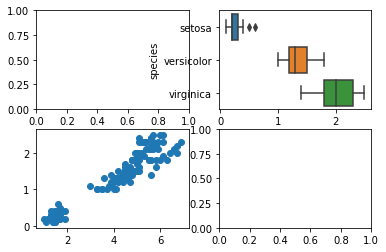

In [34]:
fig, ax = plt.subplots(2,2) #, sharex=True, sharey=True)
ax[1,0].scatter(iris['petal_length'],iris['petal_width'])
sns.boxplot(data=iris, x='petal_width', y='species', ax=ax[0,1])

In [27]:
type(ax)

numpy.ndarray

In [28]:
ax.shape

(2, 2)

In [119]:
ax[1,1]

## Missing data 

** Exercise: **

Run the commands
```
missingrows = np.random.choice(sales.index, 40)
sales.loc[missingrows, 'price'] = 0
```

We have carelessly lost some of our data. Now 40 prices are missing!

1. Display all the rows where the price is zero.
2. We realise that zero is not a good way to represent missing data. Replace all zeroes with the Python special value `None`.
3. We decide we don't want to keep any missing data in our dataset at all. Delete all rows where the price is missing.

In [37]:
missingrows = np.random.choice(sales.index, 40)
sales.loc[missingrows, 'price'] = 0

In [43]:
sales.loc[sales['price']==0, :]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long
8150,6751300065,2014-05-06,0.0,3,1.50,1430,8000,1.0,False,0,4,7,1430,0,1956,0,98007,47.5874,-122.136
3319,9262800057,2015-02-03,0.0,4,1.00,1440,9600,1.0,False,0,2,7,1440,0,1964,0,98001,47.3168,-122.264
7132,8813400345,2015-04-14,0.0,2,1.00,980,3663,1.0,False,0,5,7,980,0,1909,0,98105,47.6645,-122.288
232,5468700105,2014-08-05,0.0,3,1.75,2000,8400,1.5,False,0,4,8,2000,0,1959,0,98133,47.7535,-122.334
2006,3023049236,2014-09-16,0.0,3,2.75,3070,5280,2.0,False,1,3,7,2360,710,1950,1986,98166,47.4486,-122.353
6532,2201500980,2014-10-20,0.0,3,1.00,1350,10000,1.0,False,0,4,7,1350,0,1954,0,98006,47.5741,-122.133
1050,3123089010,2014-12-29,0.0,3,2.00,2770,89298,2.0,False,0,3,9,2770,0,2004,0,98045,47.4291,-121.842
2007,1279300085,2015-03-18,0.0,4,1.00,1780,5000,1.5,False,0,3,8,1780,0,1947,0,98115,47.6761,-122.297
1383,4139430910,2014-10-21,0.0,4,3.25,4110,15488,2.0,False,2,3,11,4110,0,1995,0,98006,47.5493,-122.117
8598,7212650510,2015-04-03,0.0,4,2.50,1830,7762,2.0,False,0,3,8,1830,0,1993,0,98003,47.2670,-122.310


In [44]:
zerorows = sales['price']==0
sales.loc[zerorows, 'price'] = None

In [45]:
sales.loc[sales['price'].isnull(), :]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long
8150,6751300065,2014-05-06,NaN,3,1.50,1430,8000,1.0,False,0,4,7,1430,0,1956,0,98007,47.5874,-122.136
3319,9262800057,2015-02-03,NaN,4,1.00,1440,9600,1.0,False,0,2,7,1440,0,1964,0,98001,47.3168,-122.264
7132,8813400345,2015-04-14,NaN,2,1.00,980,3663,1.0,False,0,5,7,980,0,1909,0,98105,47.6645,-122.288
232,5468700105,2014-08-05,NaN,3,1.75,2000,8400,1.5,False,0,4,8,2000,0,1959,0,98133,47.7535,-122.334
2006,3023049236,2014-09-16,NaN,3,2.75,3070,5280,2.0,False,1,3,7,2360,710,1950,1986,98166,47.4486,-122.353
6532,2201500980,2014-10-20,NaN,3,1.00,1350,10000,1.0,False,0,4,7,1350,0,1954,0,98006,47.5741,-122.133
1050,3123089010,2014-12-29,NaN,3,2.00,2770,89298,2.0,False,0,3,9,2770,0,2004,0,98045,47.4291,-121.842
2007,1279300085,2015-03-18,NaN,4,1.00,1780,5000,1.5,False,0,3,8,1780,0,1947,0,98115,47.6761,-122.297
1383,4139430910,2014-10-21,NaN,4,3.25,4110,15488,2.0,False,2,3,11,4110,0,1995,0,98006,47.5493,-122.117
8598,7212650510,2015-04-03,NaN,4,2.50,1830,7762,2.0,False,0,3,8,1830,0,1993,0,98003,47.2670,-122.310


In [48]:
not True

False

In [49]:
# To drop missing rows:
# use bitwise not operator ~ for numpy and pandas
sales = sales[~sales['price'].isnull()]

In [ ]:
# or use this
sales.dropna(how='any', inplace=True)

In [38]:
sales['price'].isnull().head()

6592    False
3997    False
5918    False
1647    False
4405    False
Name: price, dtype: bool

In [36]:
sales.index

Int64Index([6592, 3997, 5918, 1647, 4405, 5756, 6957, 3927, 8952, 6185,
            ...
            3712, 4660, 1869, 9626, 8271, 3740, 9518, 6224, 7747, 1267],
           dtype='int64', length=4000)

In [35]:
sales.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long
6592,8029550160,2014-05-16,433000.0,4,2.50,2280,7568,2.0,False,0,4,7,2280,0,2001,0,98056,47.5115,-122.194
3997,9542840450,2014-08-11,274000.0,3,1.50,1450,4694,2.0,False,0,3,7,1450,0,2011,0,98038,47.3654,-122.021
5918,2223089048,2014-06-25,356000.0,4,2.00,2020,48693,1.5,False,0,3,7,2020,0,1949,0,98045,47.4646,-121.759
1647,7327500270,2014-09-25,445000.0,3,2.25,1190,13630,1.0,False,0,3,7,1190,0,1984,0,98045,47.4813,-121.735
4405,9510971070,2014-08-12,675000.0,3,2.50,2250,4134,2.0,False,0,3,9,2250,0,2004,0,98052,47.6651,-122.084


In [39]:
sales.loc[6592,['date','price']]

date     2014-05-16 00:00:00
price                 433000
Name: 6592, dtype: object

In [40]:
sales.iloc[0,[1,2]]

date     2014-05-16 00:00:00
price                 433000
Name: 6592, dtype: object

## Wide-form data 

In [72]:
populations = pd.read_csv("country_populations_by_year.csv")
auspop = np.squeeze(populations[populations['Country Code']=='AUS']['1970'])
likeaus1970 = list(populations[(populations['1970'] > auspop*0.92) & (populations['1970'] < auspop*1.08)]['Country Name'])
populations_wide1 = populations.loc[populations['Country Name'].isin(likeaus1970),['Country Name','1970','1975','1980','1985','1990','1995','2000','2005','2010']]
populations_wide1.rename(columns={'Country Name':'Country'}, inplace=True)
populations_wide1

,Country,1970,1975,1980,1985,1990,1995,2000,2005,2010
0,Afghanistan,11964906,13505544,15303189.50,17160714.0,19023678.0,22475663.00,25950815.5,29904962.21,34385068.12
10,Australia,12507000,13893000,14692000.00,15758000.0,17065100.0,18072000.00,19153000.0,20394800.00,22328800.00
97,Kazakhstan,13109992,14136006,14898332.25,15780002.0,16348000.0,15815626.38,14883626.0,15147029.00,16316050.00
136,Nepal,11917872,13373069,15045329.00,16936006.0,19081064.0,21594872.00,24400606.0,27281945.00,29959364.00
137,Netherlands,13039000,13666000,14150000.00,14492000.0,14952000.0,15460000.00,15925513.0,16319868.00,16612213.00
151,Peru,13187182,15143887,17286832.00,19460111.0,21685537.0,23827163.00,25861887.0,27558769.00,29076512.00
174,Sri Lanka,12554583,13810647,15082771.00,16210466.0,17337048.0,18229498.00,18745084.0,19842536.00,20859949.00
203,Uzbekistan,11972994,13980997,15951899.00,18174143.0,20510000.0,22785000.00,24650000.0,26167369.00,28160361.37


In [52]:
populations_long = populations_wide1.melt(id_vars='Country', var_name='Year', value_name='Population')
populations_long.head()

,Country,Year,Population
0,Afghanistan,1970,11964906.0
1,Australia,1970,12507000.0
2,Kazakhstan,1970,13109992.0
3,Nepal,1970,11917872.0
4,Netherlands,1970,13039000.0


In [53]:
populations_wide2 = populations_long.pivot_table(index='Year', columns='Country', values='Population')
populations_wide2

Country,Afghanistan,Australia,Kazakhstan,Nepal,Netherlands,Peru,Sri Lanka,Uzbekistan
Year,,,,,,,,
1970,11964906.00,12507000.0,13109992.00,11917872.0,13039000.0,13187182.0,12554583.0,11972994.00
1975,13505544.00,13893000.0,14136006.00,13373069.0,13666000.0,15143887.0,13810647.0,13980997.00
1980,15303189.50,14692000.0,14898332.25,15045329.0,14150000.0,17286832.0,15082771.0,15951899.00
1985,17160714.00,15758000.0,15780002.00,16936006.0,14492000.0,19460111.0,16210466.0,18174143.00
1990,19023678.00,17065100.0,16348000.00,19081064.0,14952000.0,21685537.0,17337048.0,20510000.00
1995,22475663.00,18072000.0,15815626.38,21594872.0,15460000.0,23827163.0,18229498.0,22785000.00
2000,25950815.50,19153000.0,14883626.00,24400606.0,15925513.0,25861887.0,18745084.0,24650000.00
2005,29904962.21,20394800.0,15147029.00,27281945.0,16319868.0,27558769.0,19842536.0,26167369.00
2010,34385068.12,22328800.0,16316050.00,29959364.0,16612213.0,29076512.0,20859949.0,28160361.37


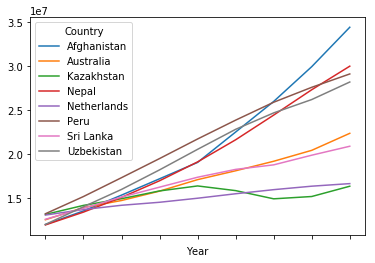

In [54]:
populations_wide2.plot()

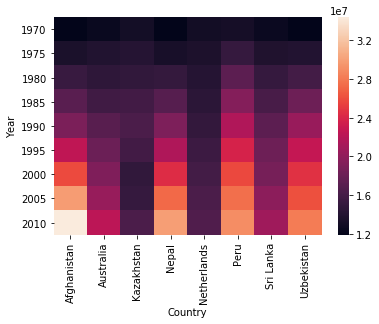

In [137]:
sns.heatmap(data=populations_wide2)

In [60]:
trace = go.Heatmap(z=populations_wide2.values,
                   x=populations_wide2.columns,
                   y=populations_wide2.index)

iplot([trace])

In [61]:
injuries.head()

,case_id,trmt_date,age,sex,body_part,product,diagnosis,location,hospital_stratum,disposition,narr,day,count
0,161205654,2016-12-01,20.0,Female,"Trunk, upper",Basketball,"Contusions, Abrasions",Not recorded,Medium Hospitals,Treated and released or examined and released ...,20YOF PLAYING BASKETBALL AND HIT IN THE CHEST ...,1,1
1,161205688,2016-12-02,29.0,Female,Ankle,Stairs or steps,Strain or Sprain,Not recorded,Medium Hospitals,Treated and released or examined and released ...,NaN,2,1
2,161205692,2016-12-02,80.0,Male,"Trunk, upper",Floors or flooring materials,"Contusions, Abrasions",Home,Medium Hospitals,Treated and admitted for hospitalization (with...,80YOM HAD A SYNCOPEL EVENT AND FELL TO THE BAT...,2,1
3,161205716,2016-12-02,43.0,Female,Face,Stairs or steps,Fracture,Home,Medium Hospitals,Treated and released or examined and released ...,43YOF SLIPPED GOING DOWN HER STAIRS FELL FACE ...,2,1
4,161205721,2016-12-02,34.0,Male,"Trunk, lower",Stairs or steps,"Contusions, Abrasions",Home,Medium Hospitals,Treated and released or examined and released ...,34YOM FELL DOWN A FLIGHT OF STAIRS AND LANDED ...,2,1


In [63]:
table = injuries.pivot_table(index='body_part', columns='product', 
                         values='count', aggfunc=sum, fill_value=0)

trace = go.Heatmap(z=table.as_matrix(), 
                     x=table.columns, y=table.index,
                     colorscale='Greens',
                     reversescale=True)

iplot([trace])

In [65]:
trace = go.Parcoords(dimensions=[dict(label='petal_length',values=iris['petal_length']),
                                 dict(label='petal_width',values=iris['petal_width']),
                                dict(label='sepal_length',values=iris['sepal_length']),
                                 dict(label='sepal_width',values=iris['sepal_width'])])

iplot([trace])

## Altair 

In [74]:
# only subsampling so we don't slow down during the demo - you can use sales directly if you prefer
subset = sales.sample(2000)


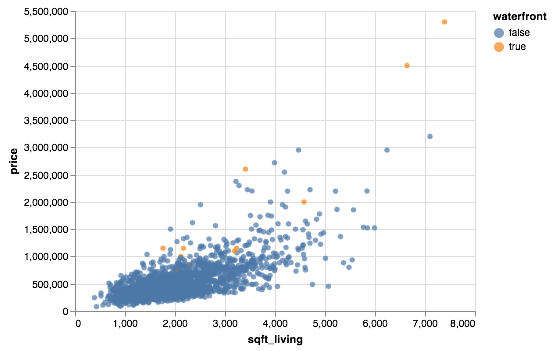

In [127]:
# try color as e.g. 'waterfront:Q', 'grade:Q', 'price:O'

alt.Chart(subset).mark_circle()\
                 .encode(x='sqft_living:Q', 
                          y='price:Q',
                          color='waterfront:N',
                          tooltip='price')\
                 .interactive()

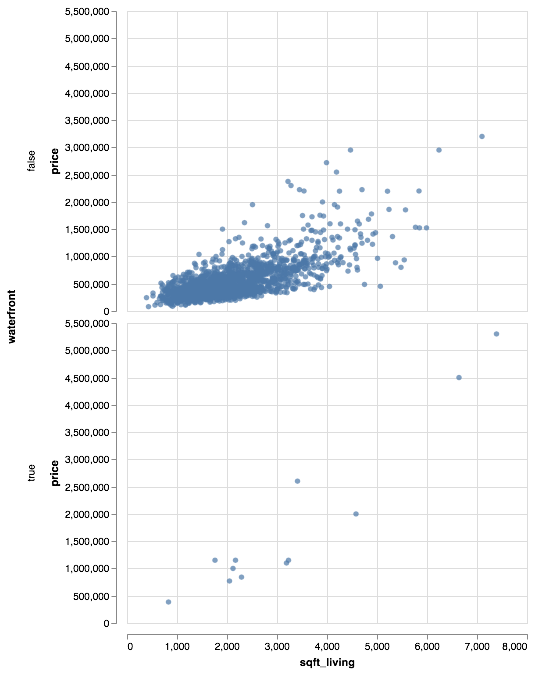

In [140]:
alt.Chart(subset).mark_circle()\
                 .encode(x='sqft_living:Q', 
                          y='price:Q',
                          row='waterfront:N',
                          tooltip='price')\
                 .interactive()

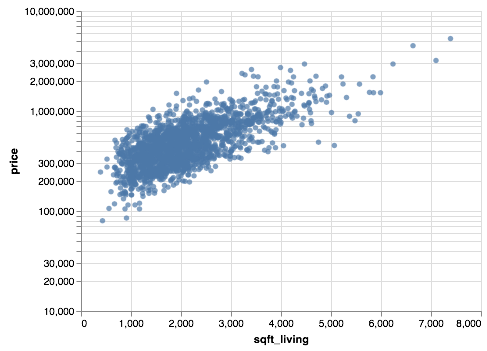

In [100]:
alt.Chart(subset).mark_circle()\
                 .encode(x='sqft_living:Q', 
                          y=alt.Y('price:Q', scale=alt.Scale(type='log')))\
                 .interactive()

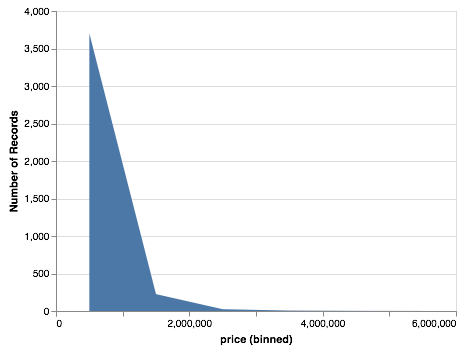

In [88]:
histogram = alt.Chart(sales).mark_area()\
                    .encode(x=alt.X('price', bin=True), y='count()')

histogram

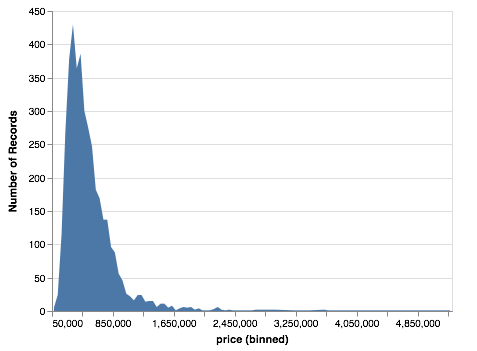

In [90]:
histogram = alt.Chart(sales).mark_area()\
                    .encode(x=alt.X('price', bin=alt.Bin(step=50000)), y='count()')

histogram

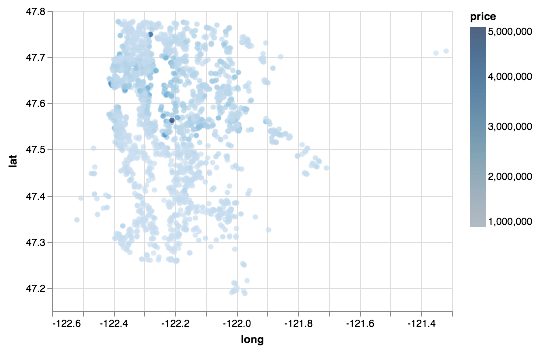

In [145]:
seattle = alt.Chart(subset).mark_circle()\
                    .encode(x=alt.X('long', scale=alt.Scale(zero=False)),
                            y=alt.Y('lat', scale=alt.Scale(zero=False)),
                            color=alt.Color('price:Q'))

seattle

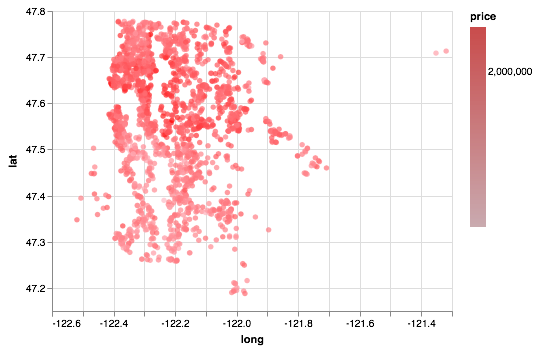

In [147]:
# NB added to this plot since class: domain and range arguments to alt.Scale()
# These set the colourmap to run from the minimum price (pink) to the maximum price (red), 
# which makes range of colours more distinct

seattle = alt.Chart(subset).mark_circle()\
                    .encode(x=alt.X('long', scale=alt.Scale(zero=False)),
                            y=alt.Y('lat', scale=alt.Scale(zero=False)),
                            color=alt.Color('price:Q', 
                                            scale=alt.Scale(type='log',
                                                            domain=[80000,5300000],
                                                            range=['pink','red'])))

seattle

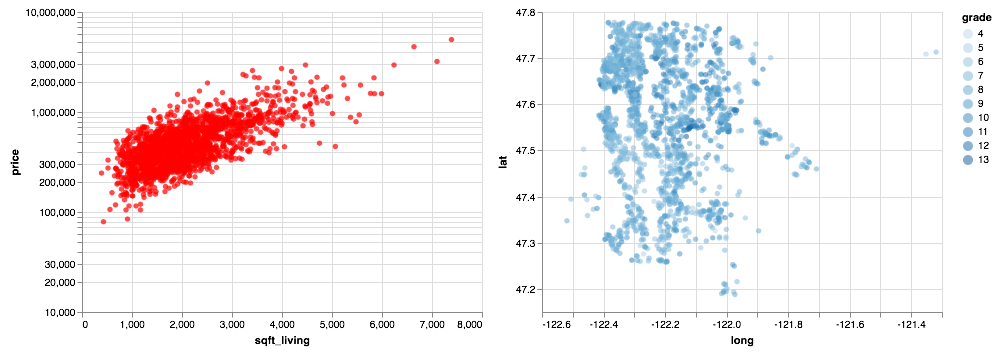

In [131]:
# NB added to this plot since the class, as extra examples:
#  * alt.value(rgb(230,230,230)) this is rgb value for a very light grey
#    in a colour specified with alt.value(), any HTML colour is allowed, including hex or rgb codes
#  * opacity=0.5 as an option to mark_circle

selected_houses = alt.selection_interval()

price_area = alt.Chart(subset).mark_circle()\
                 .encode(x='sqft_living:Q', 
                         y=alt.Y('price:Q', scale=alt.Scale(type='log')),
                         color=alt.condition(selected_houses,
                                            alt.value('red'),
                                            alt.value('green')))\
                 .add_selection(selected_houses)

seattle = alt.Chart(subset).mark_circle(opacity=0.5)\
                    .encode(x=alt.X('long', scale=alt.Scale(zero=False)),
                            y=alt.Y('lat', scale=alt.Scale(zero=False)),
                            color=alt.condition(selected_houses,
                                                'grade:O',
                                                 alt.value('rgb(230,230,230)')))

price_area | seattle